In [ ]:
import math

import matplotlib.pyplot as plt
import librosa.feature
import librosa.display
import numpy as np
from IPython.display import Audio, display
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import ruptures as rpt  # our package
import IPython.display as ipd
import pandas as pd


In [42]:
def fig_ax(figsize=(15, 5), dpi=150):
    """Return a (matplotlib) figure and ax objects with given size."""
    return plt.subplots(figsize=figsize, dpi=dpi)

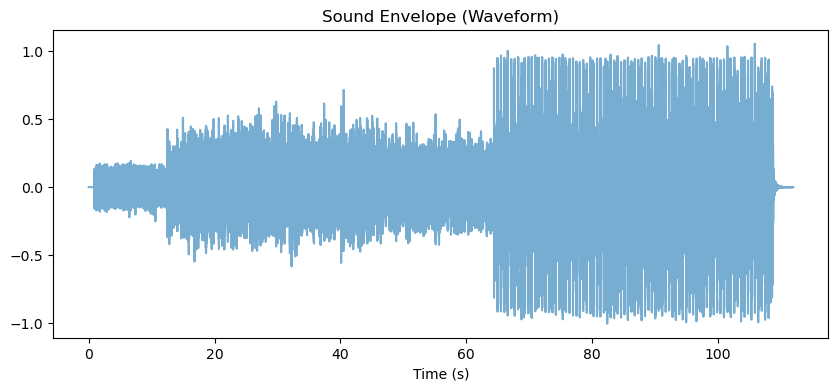

In [43]:
duration = 112  # in seconds
signal, sampling_rate = librosa.load(
    r"C:\Users\nicol\Documents\GitHub\Music-Structure-Analysis\DO NOT TOUCH\Audio Files\Emmanuel\01. Vitalic.flac", duration=duration)

# listen to the music
display(Audio(data=signal, rate=sampling_rate))

# Plot waveform
time = np.arange(len(signal)) / sampling_rate
plt.figure(figsize=(10, 4))
plt.plot(time, signal, alpha=0.6)
plt.xlabel("Time (s)")
plt.title("Sound Envelope (Waveform)")
plt.show()

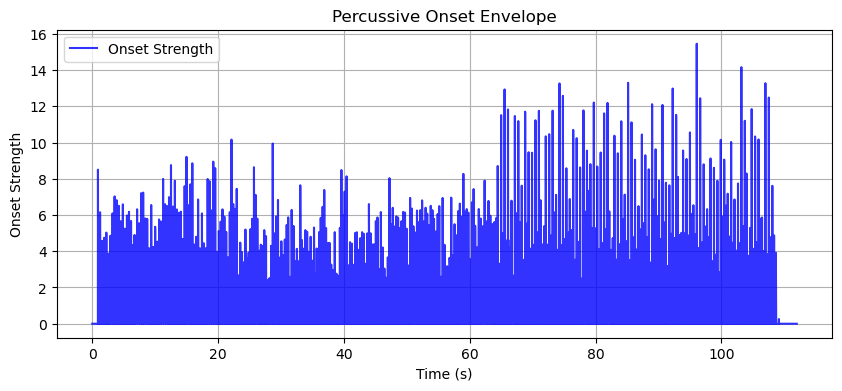

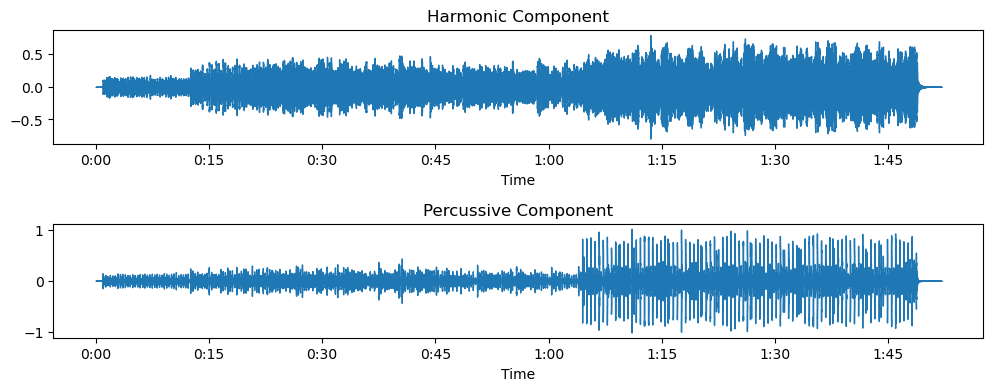

In [44]:
# Enhanced onset strength detection
hop_length_tempo = 256  # long window i guess as others are at 200 ish
y_harmonic, y_percussive = librosa.effects.hpss(signal)  # Separate percussive elements
'''
Okay so the, y_harmonic: harmonics, synth, melodies, if vocals.
y_percussive: percussive parts, drums, snares, hi-hats
'''

# Onset strength detection
oenv = librosa.onset.onset_strength(y=y_percussive, sr=sampling_rate, hop_length=256, aggregate=np.median)
times = librosa.frames_to_time(np.arange(len(oenv)), sr=sampling_rate, hop_length=256)

#viz the oenv
times = librosa.frames_to_time(np.arange(len(oenv)), sr=sampling_rate, hop_length=hop_length_tempo)

# Plot the onset envelope
plt.figure(figsize=(10, 4))
plt.plot(times, oenv, label="Onset Strength", color="blue", alpha=0.8)
plt.xlabel("Time (s)")
plt.ylabel("Onset Strength")
plt.title("Percussive Onset Envelope")
plt.legend()
plt.grid(True)
plt.show()

'''
the peaks in the onset envelope, strong drums
regular hits, kicks snares.
sudden changes, drops / breakdowns
'''

# Display both components
plt.figure(figsize=(12, 4))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y_harmonic, sr=sampling_rate)
plt.title("Harmonic Component")

plt.subplots_adjust(hspace=0.7)

plt.subplot(2, 1, 2)
librosa.display.waveshow(y_percussive, sr=sampling_rate)
plt.title("Percussive Component")
plt.show()


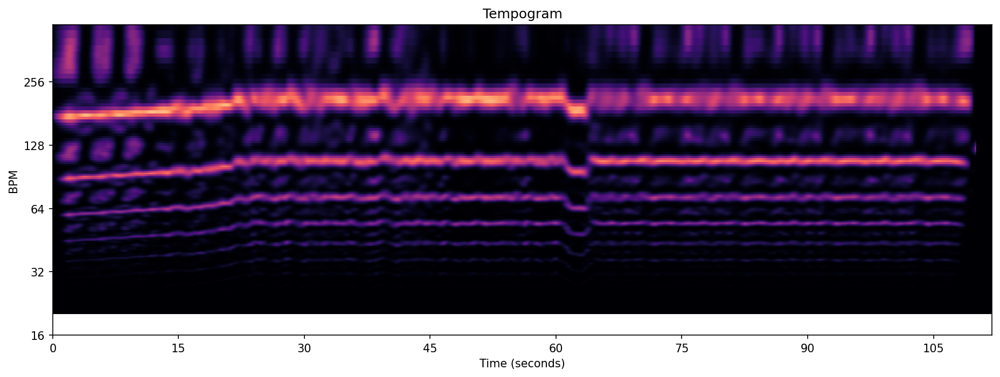

In [45]:
# tempogram getting made :))
win_length = 256  # Larger window to better capture EDM's structured rhythm
tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sampling_rate, hop_length=hop_length_tempo, win_length=win_length)

# Display tempogram
fig, ax = fig_ax()
_ = librosa.display.specshow(tempogram, ax=ax, hop_length=hop_length_tempo, sr=sampling_rate, x_axis="s", y_axis="tempo",   cmap="magma")
ax.set_title("Tempogram")
# fig.colorbar(img, ax=ax, format="%+2.0f BPM")
plt.show()


In [46]:
# Kernel change point detection from ruptures.
# changes in rhythem energy, texture, tempo, instrumentation.
algo = rpt.KernelCPD(kernel="linear").fit(tempogram.T)
penalty = duration * 0.35
bkps = algo.predict(pen=penalty)

# Convert frame indices to time
bkps_times = librosa.frames_to_time(bkps, sr=sampling_rate, hop_length=256)

# Ensure segments are at least 5 seconds apart
min_segment_length = 3  # in seconds
filtered_bkps_times = [bkps_times[0]]  # Always keep the first change point
for b in bkps_times[1:]:
    if b - filtered_bkps_times[-1] >= min_segment_length:
        filtered_bkps_times.append(b)

# Ensure the final segment reaches the end
if filtered_bkps_times[-1] != bkps_times[-1]:
    filtered_bkps_times.append(bkps_times[-1])

# Use filtered breakpoints
bkps_times = np.array(filtered_bkps_times)
print(bkps_times)

[  1.20743764   4.85297052   8.77714286  14.03646259  18.01868481
  21.46684807  37.56988662  41.76108844  45.39501134  60.97560091
  70.61188209 108.18176871 112.00145125]


Change detected at: 1.21 seconds
Change detected at: 4.85 seconds
Change detected at: 8.78 seconds
Change detected at: 14.04 seconds
Change detected at: 18.02 seconds
Change detected at: 21.47 seconds
Change detected at: 37.57 seconds
Change detected at: 41.76 seconds
Change detected at: 45.40 seconds
Change detected at: 60.98 seconds
Change detected at: 70.61 seconds
Change detected at: 108.18 seconds
Segment 1: 0.00s - 1.21s (Duration: 1.21s)
Segment 2: 1.21s - 4.85s (Duration: 3.65s)
Segment 3: 4.85s - 8.78s (Duration: 3.92s)
Segment 4: 8.78s - 14.04s (Duration: 5.26s)
Segment 5: 14.04s - 18.02s (Duration: 3.98s)
Segment 6: 18.02s - 21.47s (Duration: 3.45s)
Segment 7: 21.47s - 37.57s (Duration: 16.10s)
Segment 8: 37.57s - 41.76s (Duration: 4.19s)
Segment 9: 41.76s - 45.40s (Duration: 3.63s)
Segment 10: 45.40s - 60.98s (Duration: 15.58s)
Segment 11: 60.98s - 70.61s (Duration: 9.64s)
Segment 12: 70.61s - 108.18s (Duration: 37.57s)
Segment 13: 108.18s - 112.00s (Duration: 3.82s)
number

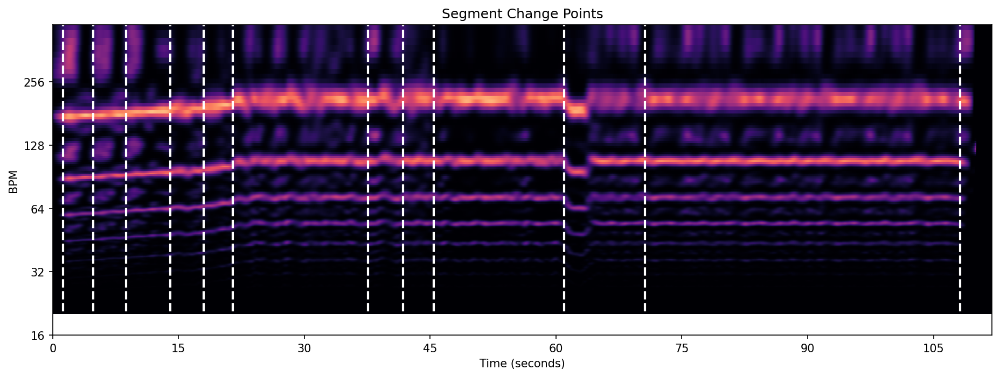

In [47]:
# Visuals of detected changes
fig, ax = fig_ax()
_ = librosa.display.specshow(tempogram, ax=ax, hop_length=hop_length_tempo, sr=sampling_rate, x_axis="s", y_axis="tempo", cmap="magma")
ax.set_title("Segment Change Points")

for b in bkps_times[:-1]:
    ax.axvline(b, ls="--", color="white", lw=2)
    print(f"Change detected at: {b:.2f} seconds")


# Extract segments and display their timestamps
bkps_time_indexes = (sampling_rate * bkps_times).astype(int).tolist()

# store the segments into an array for later
audio_segments = []

for segment_number, (start, end) in enumerate(rpt.utils.pairwise([0] + bkps_time_indexes), start=1):
    start_time = start / sampling_rate
    end_time = end / sampling_rate
    duration = (end - start) / sampling_rate

    segment_audio = signal[start:end]  # Extract segments
    audio_segments.append(segment_audio)

    print(f"Segment {segment_number}: {start_time:.2f}s - {end_time:.2f}s (Duration: {duration:.2f}s)")
    # display(Audio(data=signal[start:end], rate=sampling_rate))

print("number of segments: {}".format(len(audio_segments)))


Ground Truth: 0.877
Ground Truth: 12.466
Ground Truth: 23.214
Ground Truth: 34.094
Ground Truth: 45.019
Ground Truth: 48.285
Ground Truth: 58.099
Ground Truth: 64.933
Ground Truth: 75.873
Ground Truth: 86.752
Ground Truth: 97.673
Ground Truth: 108.595
Segment 1: 0.00s - 1.21s (Duration: 1.21s)
Segment 2: 1.21s - 4.85s (Duration: 3.65s)
Segment 3: 4.85s - 8.78s (Duration: 3.92s)
Segment 4: 8.78s - 14.04s (Duration: 5.26s)
Segment 5: 14.04s - 18.02s (Duration: 3.98s)
Segment 6: 18.02s - 21.47s (Duration: 3.45s)
Segment 7: 21.47s - 37.57s (Duration: 16.10s)
Segment 8: 37.57s - 41.76s (Duration: 4.19s)
Segment 9: 41.76s - 45.40s (Duration: 3.63s)
Segment 10: 45.40s - 60.98s (Duration: 15.58s)
Segment 11: 60.98s - 70.61s (Duration: 9.64s)
Segment 12: 70.61s - 108.18s (Duration: 37.57s)
Segment 13: 108.18s - 112.00s (Duration: 3.82s)
Number of segments: 13
Number of REAL segments: 12


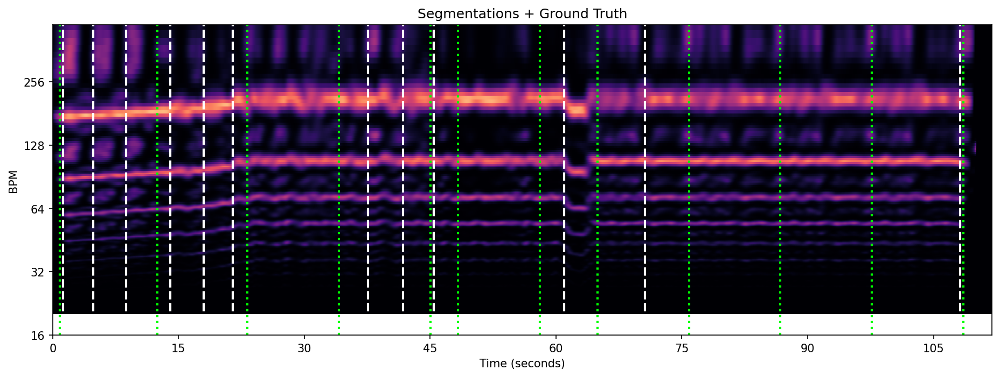

In [48]:
9# Visuals of detected changes + ground truth
fig, ax = fig_ax()
_ = librosa.display.specshow(tempogram, ax=ax, hop_length=hop_length_tempo, sr=sampling_rate, x_axis="s", y_axis="tempo", cmap="magma")
ax.set_title("Segmentations + Ground Truth")

# change points
for b in bkps_times[:-1]:
    ax.axvline(b, ls="--", color="white", lw=2, label="Detected Change" if b == bkps_times[0] else "")

# CSV
gt_df = pd.read_csv(r"C:\Users\nicol\Documents\GitHub\Music-Structure-Analysis\DO NOT TOUCH\GroundTruthData\GroundTruthRight\parsed_data_1.csv")  # Replace with your actual file path

# list of floats
ground_truth_times = gt_df["TIMESTAMP"].tolist()

# Plot ground truth lines
for gt in ground_truth_times:
    ax.axvline(gt, ls=":", color="lime", lw=2, label="Ground Truth" if gt == ground_truth_times[0] else "")
    print("Ground Truth: {}".format(gt))


# Extract segments and display their timestamps
bkps_time_indexes = (sampling_rate * bkps_times).astype(int).tolist()
audio_segments = []

for segment_number, (start, end) in enumerate(rpt.utils.pairwise([0] + bkps_time_indexes), start=1):
    start_time = start / sampling_rate
    end_time = end / sampling_rate
    duration = (end - start) / sampling_rate

    segment_audio = signal[start:end]  # Extract segments
    audio_segments.append(segment_audio)

    print(f"Segment {segment_number}: {start_time:.2f}s - {end_time:.2f}s (Duration: {duration:.2f}s)")

print("Number of segments: {}".format(len(audio_segments)))
print("Number of REAL segments: {}".format(len(gt_df["TIMESTAMP"].tolist())))


In [49]:
import pandas as pd

# === CALCULATES SCORE WITHIN 3s OF GT ====
def gaussian_score_flat_top(time_diff, sigma=0.9, flat_top=0.25):
    abs_diff = abs(time_diff)
    if abs_diff <= flat_top:
        return 100.0
    elif abs_diff >= 3:
        return 0.0
    else:
        adjusted_diff = abs_diff - flat_top
        return 100.0 * math.exp(- (adjusted_diff ** 2) / (2 * sigma ** 2))

# === Load ground truth from CSV ===
ground_truth_path = r"C:\Users\nicol\Documents\GitHub\Music-Structure-Analysis\DO NOT TOUCH\GroundTruthData\GroundTruthRight\parsed_data_1.csv"
gt_times = pd.read_csv(ground_truth_path)['TIMESTAMP'].values  # Extract 'TIMESTAMP' column

# === Scoring ===
scores = []
matched_preds = []

for gt in gt_times:
    if len(bkps_times) == 0:
        scores.append(0.0)
        matched_preds.append(None)
        continue
    closest_pred = min(bkps_times, key=lambda p: abs(p - gt))
    matched_preds.append(closest_pred)
    time_diff = closest_pred - gt
    score = gaussian_score_flat_top(time_diff)
    scores.append(score)

# === Results ===
print("\n--- Evaluation Results ---")
for i, (gt, pred, score) in enumerate(zip(gt_times, matched_preds, scores), 1):
    print(f"{i:02}: GT={gt:.2f}s | Closest Pred={pred:.2f}s | Diff={pred - gt:+.2f}s | Score={score:.2f}")

avg_score = np.mean(scores)
print(f"\nAverage Score: {avg_score:.2f}")


--- Evaluation Results ---
01: GT=0.88s | Closest Pred=1.21s | Diff=+0.33s | Score=99.60
02: GT=12.47s | Closest Pred=14.04s | Diff=+1.57s | Score=34.09
03: GT=23.21s | Closest Pred=21.47s | Diff=-1.75s | Score=25.07
04: GT=34.09s | Closest Pred=37.57s | Diff=+3.48s | Score=0.00
05: GT=45.02s | Closest Pred=45.40s | Diff=+0.38s | Score=99.02
06: GT=48.28s | Closest Pred=45.40s | Diff=-2.89s | Score=1.35
07: GT=58.10s | Closest Pred=60.98s | Diff=+2.88s | Score=1.41
08: GT=64.93s | Closest Pred=60.98s | Diff=-3.96s | Score=0.00
09: GT=75.87s | Closest Pred=70.61s | Diff=-5.26s | Score=0.00
10: GT=86.75s | Closest Pred=70.61s | Diff=-16.14s | Score=0.00
11: GT=97.67s | Closest Pred=108.18s | Diff=+10.51s | Score=0.00
12: GT=108.59s | Closest Pred=108.18s | Diff=-0.41s | Score=98.37

Average Score: 29.91


13


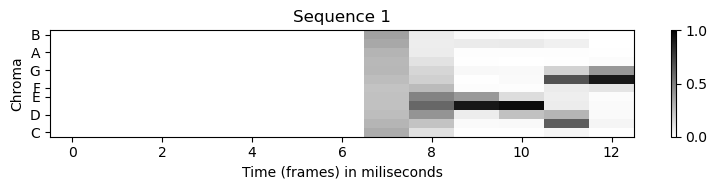

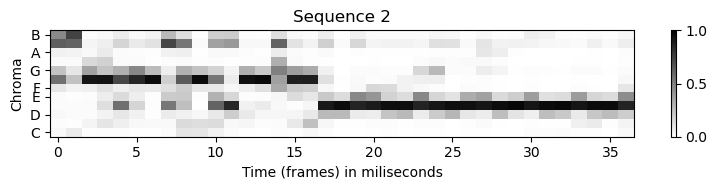

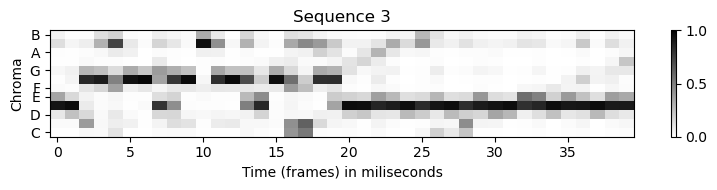

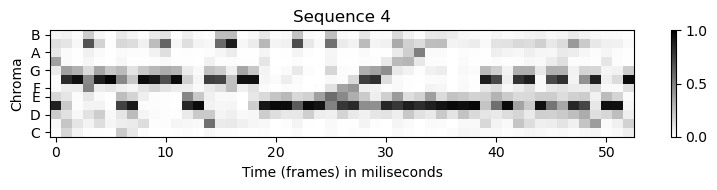

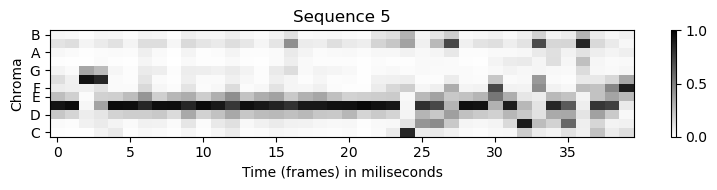

...

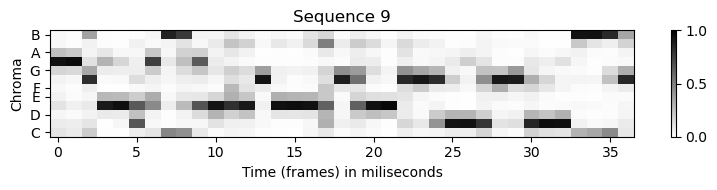

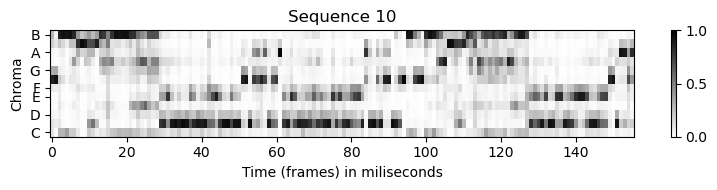

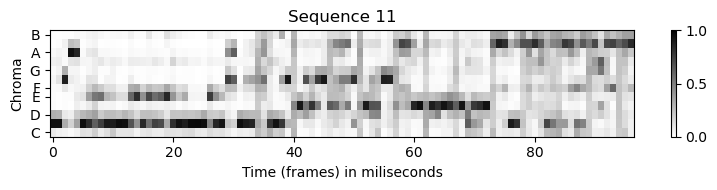

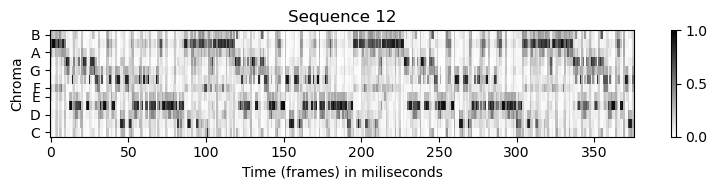

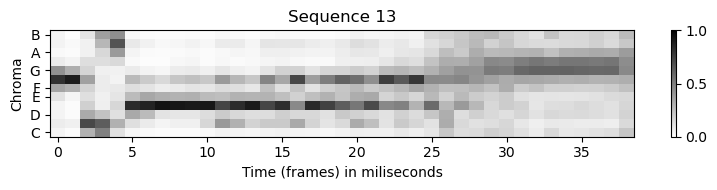

In [50]:
# see if the audio is loaded in
print(len(audio_segments))
# print(audio_segments)

# frame rate sample?
Fs = 22050

# load the files :)
X_wav = audio_segments[0]

# Parameters for chroma features - change them if you like?
N = 4410  # FFT window size
H = 2205  # Hop length

for i, X_wav in enumerate(audio_segments):
    X = librosa.feature.chroma_stft(y=X_wav, sr=Fs, tuning=0, norm=2, hop_length=H, n_fft=N)

    #plots it
    plt.figure(figsize=(8, 2))
    plt.title(f'Sequence {i+1}')
    librosa.display.specshow(X, x_axis='frames', y_axis='chroma', cmap='gray_r', hop_length=H)
    plt.xlabel('Time (frames) in miliseconds')
    plt.ylabel('Chroma')
    plt.colorbar()
    plt.clim([0, 1])
    plt.tight_layout()
    plt.show()

    # This plays the audio - can be commented out :)
    ipd.display(ipd.Audio(X_wav, rate=Fs))
